In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 35.6 MB/s eta 0:00:00


Loaded 84 foods from CSV
Loading YOLO...
Loading MiDaS...


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/rwightman_gen-efficientnet-pytorch_master
Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master



Found 10 images

Processing: WhatsApp Image 2026-02-19 at 8.54.50 PM.jpeg
Highest Confidence Detection: achar_pickle (0.17)


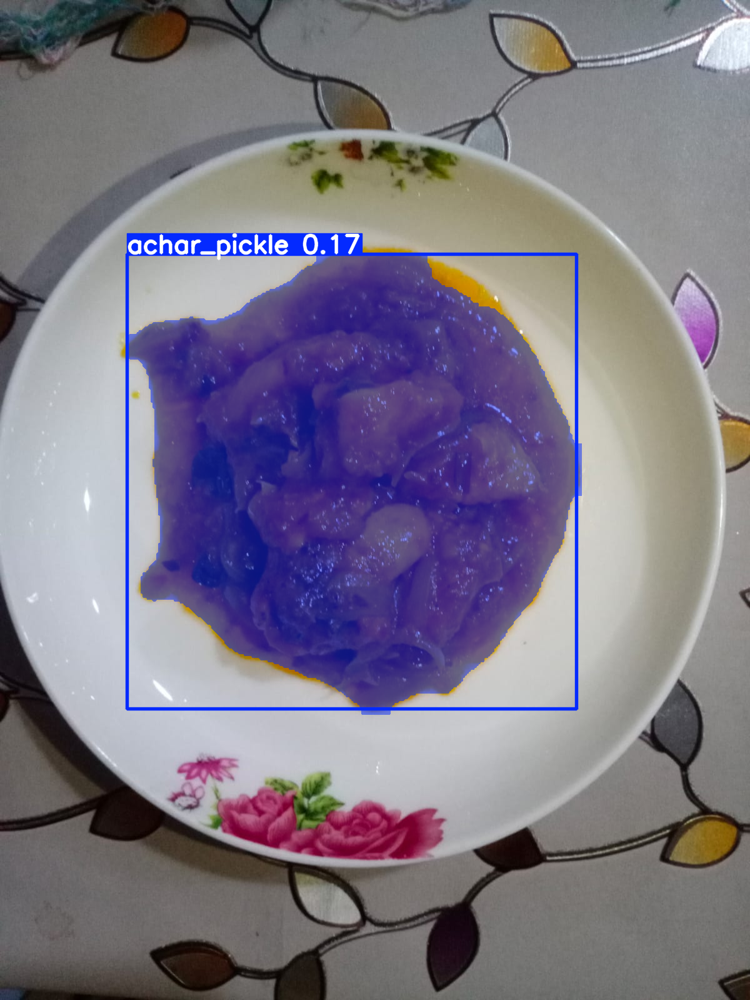


ESTIMATED NUTRITION
Food: achar_pickle
Weight: 247.46 g
Calories: 98.98 kcal
Protein: 1.24 g
Carbs: 24.75 g
Fat: 4.95 g
Fibre: 2.47 g

Processing: WhatsApp Image 2026-02-19 at 9.03.18 PM.jpeg
Highest Confidence Detection: roti (0.26)


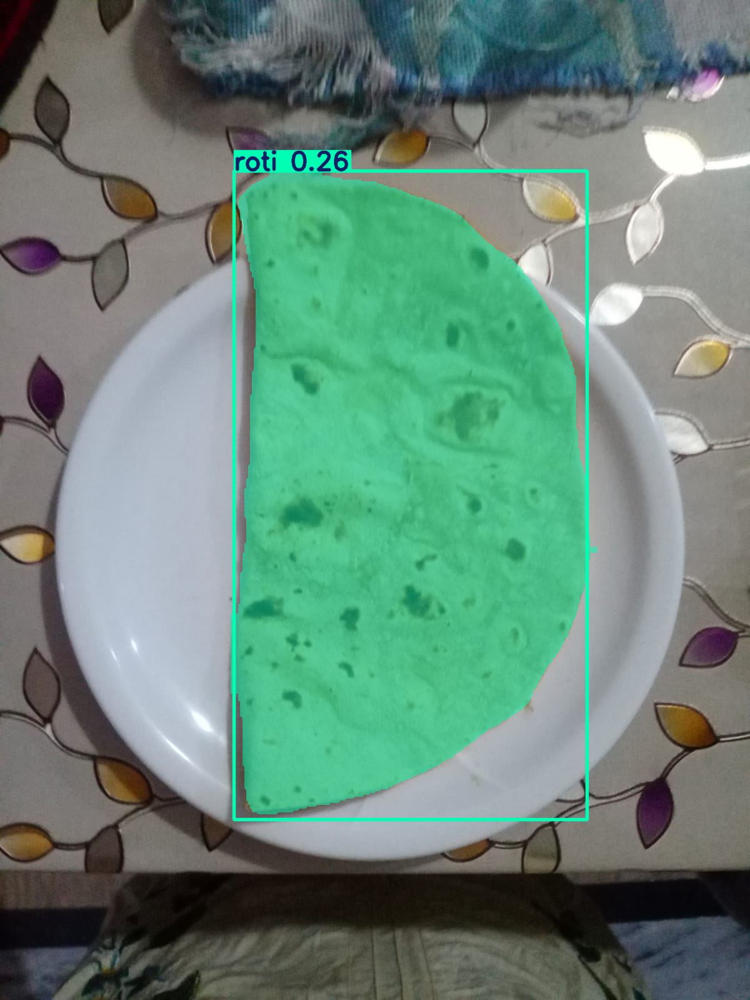


ESTIMATED NUTRITION
Food: roti
Weight: 667.73 g
Calories: 1736.09 kcal
Protein: 56.76 g
Carbs: 300.48 g
Fat: 46.74 g
Fibre: 13.35 g

Processing: ca37a86f-70ff-4ac4-b657-22e61c451095.jpeg
Highest Confidence Detection: jalebi (0.29)


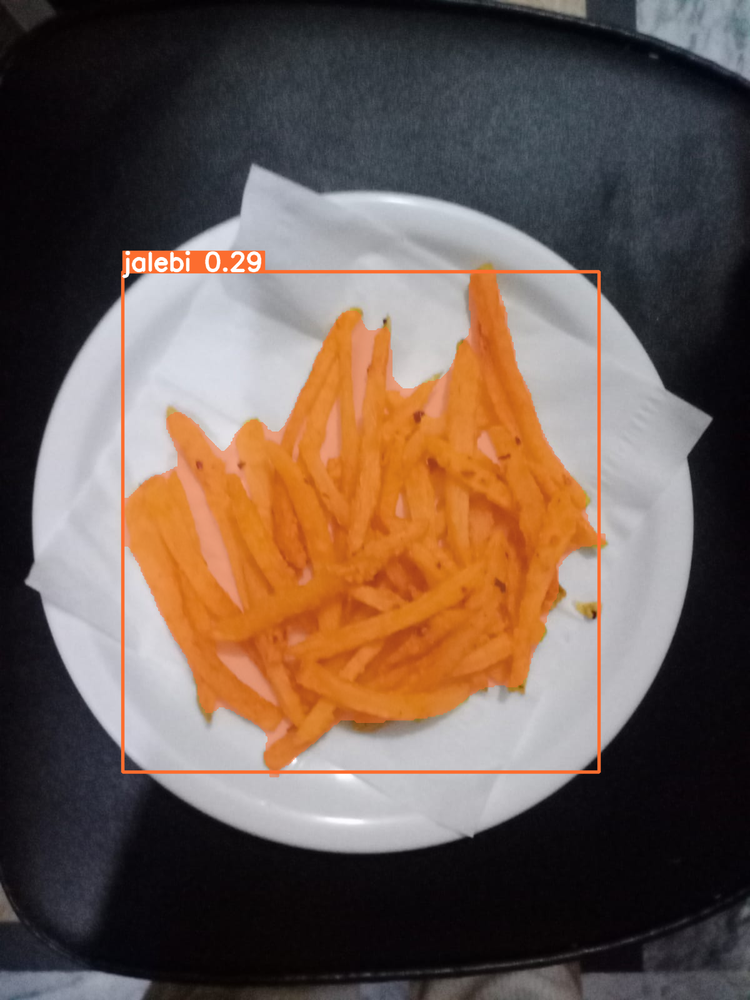


ESTIMATED NUTRITION
Food: jalebi
Weight: 63.83 g
Calories: 223.41 kcal
Protein: 2.55 g
Carbs: 47.87 g
Fat: 6.38 g
Fibre: 0.32 g

Processing: a81efd49-de39-4a00-acdd-04a55277804a.jpeg
No objects detected.


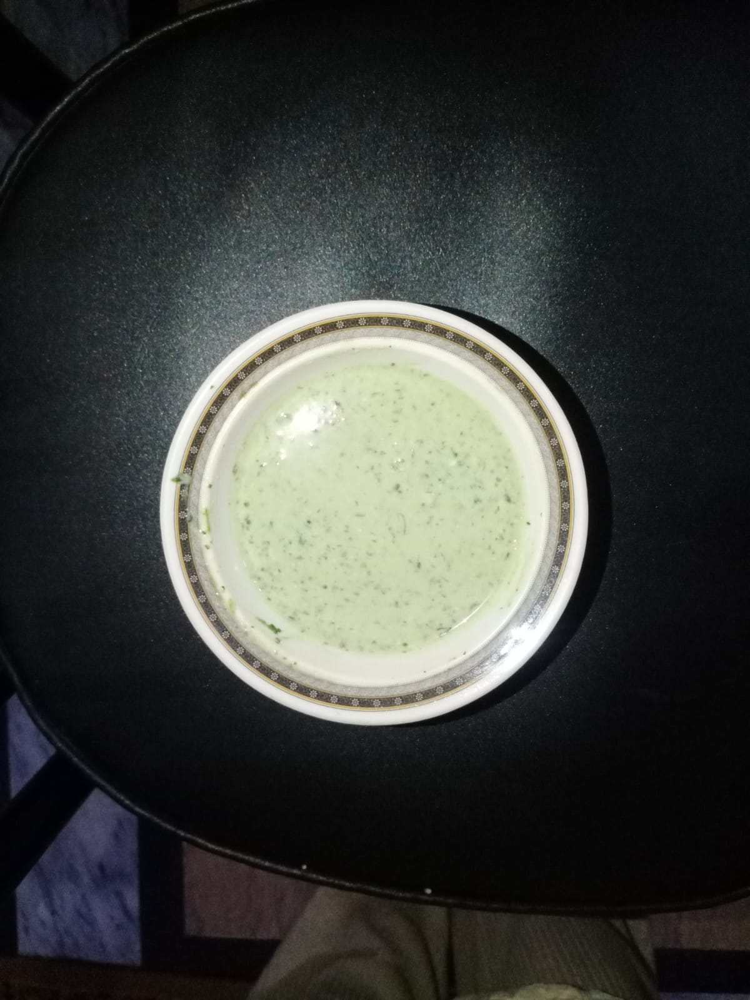


Processing: 939f09f1-102b-4777-8116-d4065d605ab2.jpeg
Highest Confidence Detection: meethe_chawal (0.21)


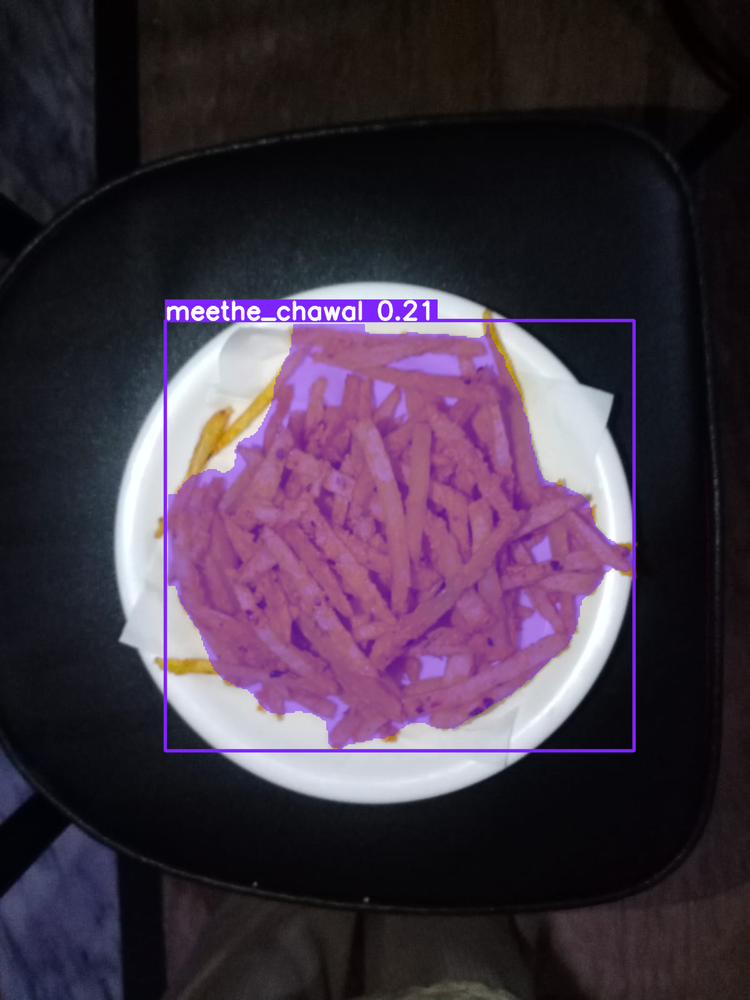


ESTIMATED NUTRITION
Food: meethe_chawal
Weight: 42.28 g
Calories: 114.16 kcal
Protein: 1.48 g
Carbs: 24.52 g
Fat: 2.33 g
Fibre: 0.42 g

Processing: 1f2f2892-856a-4c8b-87ed-1ec34bad7573.jpeg
Highest Confidence Detection: meethe_chawal (0.22)


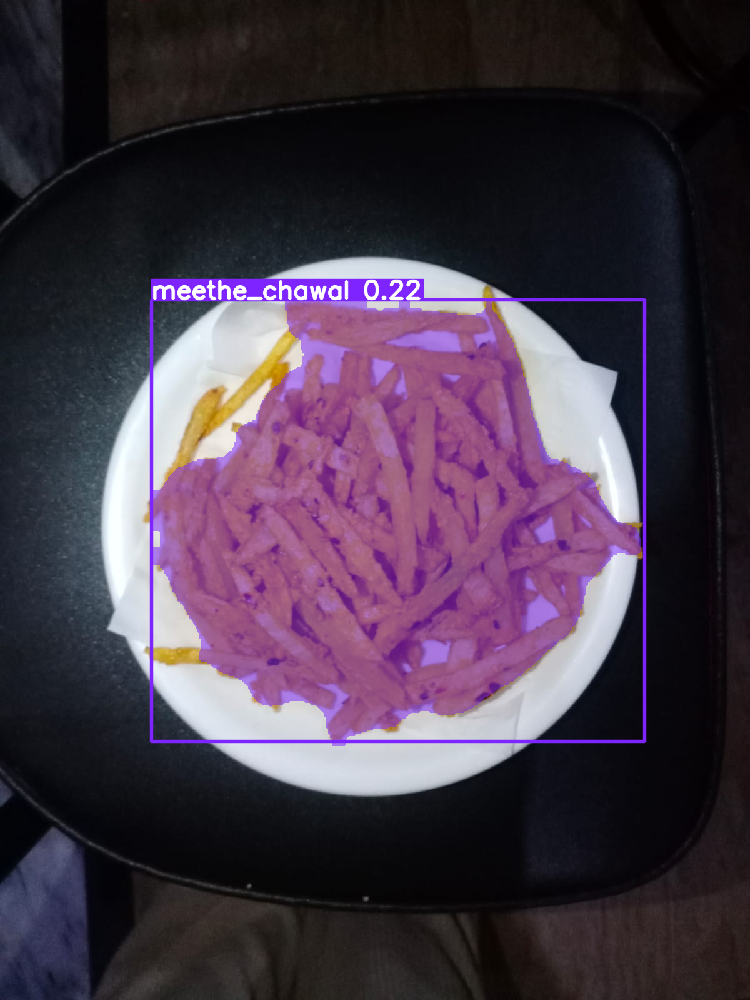


ESTIMATED NUTRITION
Food: meethe_chawal
Weight: 52.98 g
Calories: 143.05 kcal
Protein: 1.85 g
Carbs: 30.73 g
Fat: 2.91 g
Fibre: 0.53 g

Processing: 202a7081-606d-4520-a4d2-fd65581fcc6a.jpeg
Highest Confidence Detection: barfi (0.17)


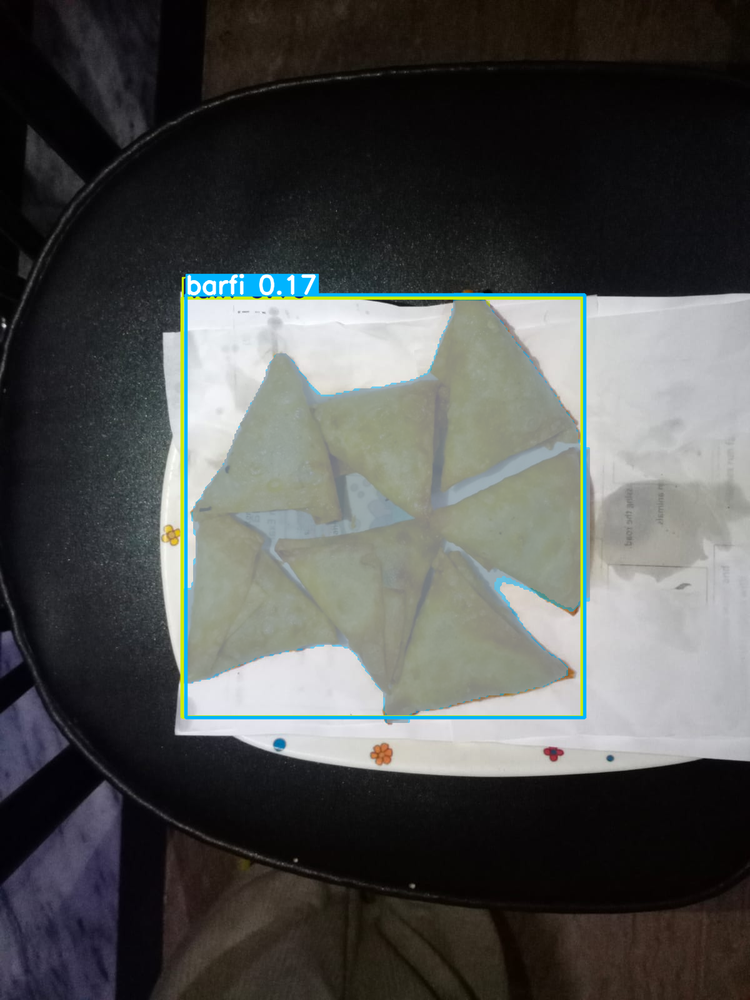


ESTIMATED NUTRITION
Food: barfi
Weight: 298.80 g
Calories: 956.16 kcal
Protein: 19.42 g
Carbs: 104.58 g
Fat: 53.78 g
Fibre: 2.99 g

Processing: 043ec541-f164-4d98-872d-d9e39b8567bc.jpeg
Highest Confidence Detection: kulfi (0.22)


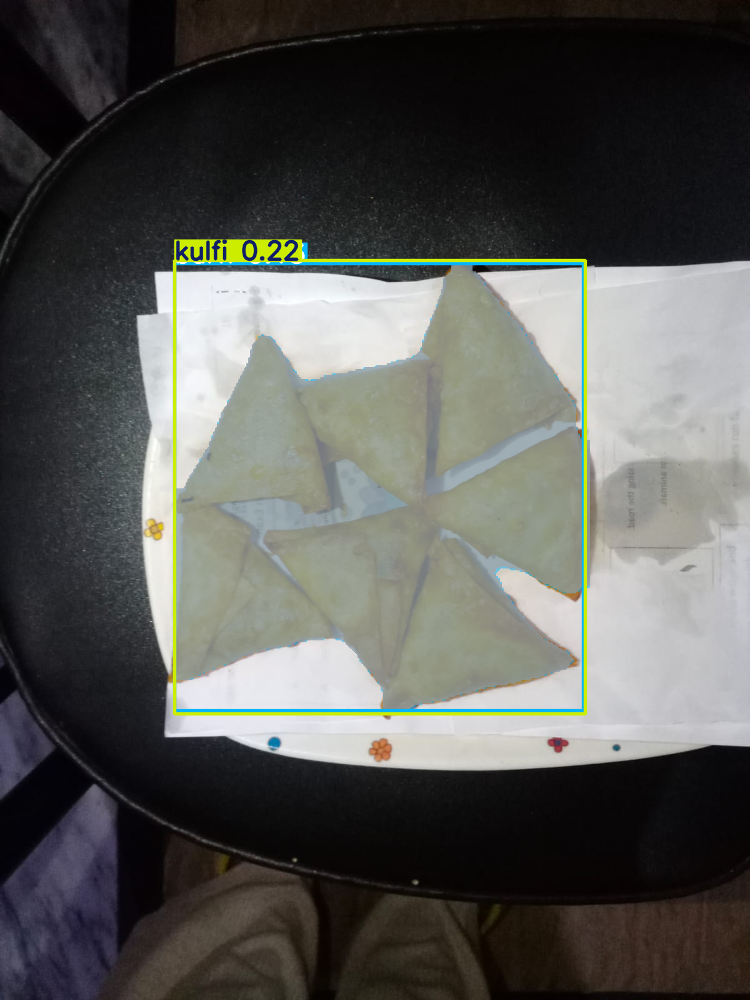


ESTIMATED NUTRITION
Food: kulfi
Weight: 184.57 g
Calories: 387.59 kcal
Protein: 9.23 g
Carbs: 44.30 g
Fat: 18.46 g
Fibre: 0.00 g

Processing: 1a4a3136-270f-46da-9dd4-d06e94494f1f.jpeg
No objects detected.


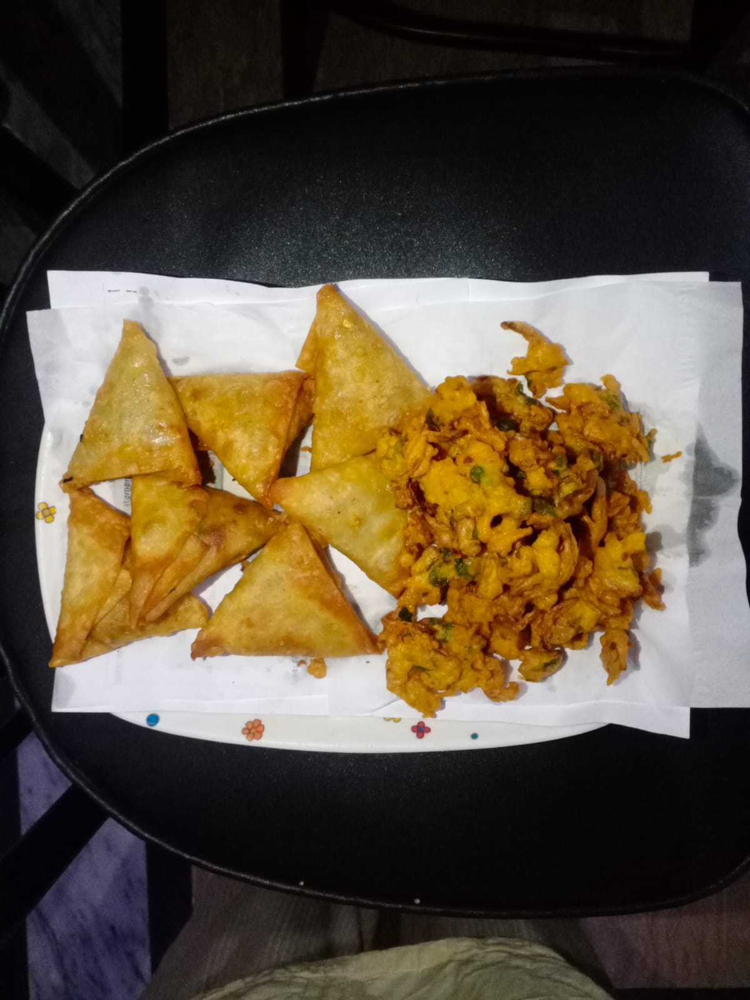


Processing: 9433491e-e852-49e9-a75d-a9c2e86a6f45.jpeg
No objects detected.


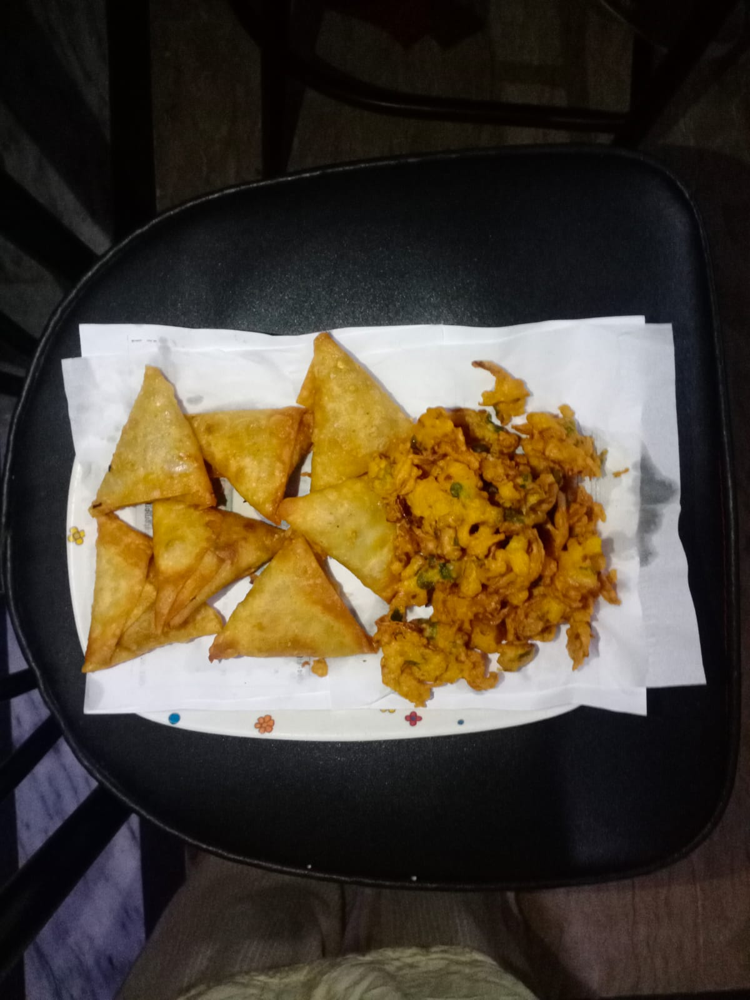


Processing Complete!


In [ ]:
import cv2
import numpy as np
import torch
import pandas as pd
from ultralytics import YOLO
import os
from google.colab.patches import cv2_imshow

# -----------------------------
# GOOGLE DRIVE PATHS
# -----------------------------
IMAGE_FOLDER = "/content/drive/MyDrive/TEST-DATA/"
MODEL_PATH = "/content/drive/MyDrive/models/epoch8.pt"
DENSITY_CSV = "/content/drive/MyDrive/models/pakistani_food_nutrients_template_Updated.csv"
OUTPUT_FOLDER = "/content/drive/MyDrive/segmented_outputs/"

os.makedirs(OUTPUT_FOLDER, exist_ok=True)

# -----------------------------
# CONSTANT REFERENCE DIMENSIONS
# -----------------------------
BOX_WIDTH_PX = 315
BOX_HEIGHT_PX = 504
REAL_WIDTH_CM = 5.0
REAL_HEIGHT_CM = 8.0
CAMERA_HEIGHT_CM = 30.0

CM_PER_PIXEL_WIDTH = REAL_WIDTH_CM / BOX_WIDTH_PX
CM_PER_PIXEL_HEIGHT = REAL_HEIGHT_CM / BOX_HEIGHT_PX
AREA_CONVERSION_FACTOR = CM_PER_PIXEL_WIDTH * CM_PER_PIXEL_HEIGHT

# -----------------------------
# LOAD FOOD NUTRIENTS + DENSITY
# -----------------------------
try:
    df = pd.read_csv(DENSITY_CSV)
    df.columns = df.columns.str.strip().str.lower()

    food_nutrient_map = {}

    for _, row in df.iterrows():
        food_name = str(row["food_name"]).strip().lower()

        food_nutrient_map[food_name] = {
            "density": row["density_g_per_cm3"],
            "calories": row["calories_per_100g"],
            "protein": row["protein_g_per_100g"],
            "carbs": row["carb_g_per_100g"],
            "fat": row["fat_g_per_100g"],
            "fibre": row["fiber_g_per_100g"]
        }

    print(f"Loaded {len(food_nutrient_map)} foods from CSV")

except Exception as e:
    print("CSV Loading Error:", e)
    food_nutrient_map = {}

# -----------------------------
# LOAD MODELS
# -----------------------------
print("Loading YOLO...")
yolo_model = YOLO(MODEL_PATH)

print("Loading MiDaS...")
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS_small")
midas.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
midas.to(device)

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
transform = midas_transforms.small_transform

# -----------------------------
# DEPTH FUNCTION
# -----------------------------
def get_depth_map(image):
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_batch = transform(img_rgb).to(device)

    with torch.no_grad():
        prediction = midas(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img_rgb.shape[:2],
            mode="bicubic",
            align_corners=False,
        ).squeeze()

    depth_map = prediction.cpu().numpy()
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min() + 1e-8)
    return depth_normalized

# -----------------------------
# PROCESS IMAGE
# -----------------------------
def process_image(image_path):

    print("\n" + "="*50)
    print("Processing:", os.path.basename(image_path))
    print("="*50)

    image = cv2.imread(image_path)
    if image is None:
        print("Error reading image.")
        return

    # ---- Depth ----
    depth_normalized = get_depth_map(image)
    table_depth_norm = np.percentile(depth_normalized, 95)
    depth_real_cm = (depth_normalized / (table_depth_norm + 1e-8)) * CAMERA_HEIGHT_CM

    # ---- YOLO Detection ----
    results = yolo_model(image, conf=0.05, iou=0.7, verbose=False)

    if len(results[0].boxes) == 0:
        print("No objects detected.")
        cv2_imshow(image)
        return

    boxes = results[0].boxes
    class_names = results[0].names

    confidences = boxes.conf.cpu().numpy()
    classes = boxes.cls.cpu().numpy()

    # Select highest confidence detection
    max_idx = np.argmax(confidences)
    selected_class = int(classes[max_idx])
    selected_conf = confidences[max_idx]

    print(f"Highest Confidence Detection: {class_names[selected_class]} ({selected_conf:.2f})")

    # ---- Show Segmented Image ----
    annotated_img = results[0].plot()
    cv2_imshow(annotated_img)

    save_path = os.path.join(OUTPUT_FOLDER, os.path.basename(image_path))
    cv2.imwrite(save_path, annotated_img)

    # ---- Check Segmentation Mask ----
    if results[0].masks is None:
        print("Model does not support segmentation.")
        return

    masks = results[0].masks.data.cpu().numpy()
    selected_mask = masks[max_idx]

    if selected_mask.shape != image.shape[:2]:
        selected_mask = cv2.resize(selected_mask, (image.shape[1], image.shape[0]))

    # ---- Area Calculation ----
    binary_mask = (selected_mask > 0.5).astype(np.uint8)
    area_pixels = np.sum(binary_mask)
    area_cm2 = area_pixels * AREA_CONVERSION_FACTOR

    object_depth_values = depth_real_cm[binary_mask == 1]

    if len(object_depth_values) == 0:
        print("No depth data.")
        return

    mean_depth_cm = np.mean(object_depth_values)
    height_cm = max(0, min(CAMERA_HEIGHT_CM - mean_depth_cm, CAMERA_HEIGHT_CM))
    volume_cm3 = area_cm2 * height_cm

    class_name = class_names[selected_class].strip().lower()

    # ---- Nutrition Calculation ----
    if class_name in food_nutrient_map:

        food_info = food_nutrient_map[class_name]
        density = food_info["density"]

        weight_g = volume_cm3 * density
        factor = weight_g / 100

        calories = food_info["calories"] * factor
        protein = food_info["protein"] * factor
        carbs = food_info["carbs"] * factor
        fat = food_info["fat"] * factor
        fibre = food_info["fibre"] * factor

        print("\nESTIMATED NUTRITION")
        print(f"Food: {class_name}")
        print(f"Weight: {weight_g:.2f} g")
        print(f"Calories: {calories:.2f} kcal")
        print(f"Protein: {protein:.2f} g")
        print(f"Carbs: {carbs:.2f} g")
        print(f"Fat: {fat:.2f} g")
        print(f"Fibre: {fibre:.2f} g")

    else:
        print(f"{class_name} not found in CSV")
        print("Available foods:", list(food_nutrient_map.keys())[:10])

# -----------------------------
# MAIN
# -----------------------------
def main():
    image_files = [f for f in os.listdir(IMAGE_FOLDER)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not image_files:
        print("No images found.")
        return

    print(f"\nFound {len(image_files)} images")

    for img_file in image_files:
        process_image(os.path.join(IMAGE_FOLDER, img_file))

    print("\nProcessing Complete!")

if __name__ == "__main__":
    main()

In [ ]:
from google.colab import files

# Upload file dialog
uploaded = files.upload()  # Select data.yaml from your PC

# Get the filename
DATA_YAML = list(uploaded.keys())[0]
print("Using YAML file:", DATA_YAML)

Saving data.yaml to data.yaml
Using YAML file: data.yaml


In [ ]:
# ==========================================
# YOLO MODEL EVALUATION (Detection/Segmentation)
# ==========================================

from ultralytics import YOLO

MODEL_PATH = "/content/drive/MyDrive/models/epoch8.pt"


model = YOLO(MODEL_PATH)

metrics = model.val(
    data=DATA_YAML,
    imgsz=640,
    conf=0.001,
    iou=0.6,
    device=0
)

print("\n====== YOLO EVALUATION RESULTS ======")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")
print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5:0.95: {metrics.box.map:.4f}")

# For segmentation models:
if hasattr(metrics, "seg"):
    print("\nSegmentation Metrics:")
    print(f"mAP@0.5 (mask): {metrics.seg.map50:.4f}")
    print(f"mAP@0.5:0.95 (mask): {metrics.seg.map:.4f}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,449,275 parameters, 0 gradients, 12.2 GFLOPs



FileNotFoundError: Dataset 'data.yaml' images not found, missing path '/content/val/images'
Note dataset download directory is '/content/datasets'. You can update this in '/root/.config/Ultralytics/settings.json'

In [ ]:
import cv2
import numpy as np
import torch
import pandas as pd
from ultralytics import YOLO
import os
from google.colab.patches import cv2_imshow

# -----------------------------
# GOOGLE DRIVE PATHS
# -----------------------------
IMAGE_FOLDER = "/content/drive/MyDrive/TEST-DATA/"   # folder containing images
MODEL_PATH = "/content/drive/MyDrive/models/yolov8-seg/epoch8.pt"
DENSITY_CSV = "/content/drive/MyDrive/models/pakistani_food_nutrients_template_Updated.csv"
OUTPUT_FOLDER = "/content/drive/MyDrive/segmented_outputs/"

os.makedirs(OUTPUT_FOLDER, exist_ok=True)

# -----------------------------
# CONSTANT REFERENCE DIMENSIONS (YOUR FIXED BOX)
# -----------------------------
# UI Box dimensions on screen
BOX_WIDTH_PX = 315      # Width in pixels
BOX_HEIGHT_PX = 504     # Height in pixels

# Real-world dimensions this box represents
REAL_WIDTH_CM = 5.0     # 5 cm
REAL_HEIGHT_CM = 8.0    # 8 cm

# Camera setup
CAMERA_HEIGHT_CM = 30.0  # Camera height from table

# -----------------------------
# DERIVED CONSTANTS (FIXED)
# -----------------------------
# Pixel to cm conversion (constant for all images)
CM_PER_PIXEL_WIDTH = REAL_WIDTH_CM / BOX_WIDTH_PX
CM_PER_PIXEL_HEIGHT = REAL_HEIGHT_CM / BOX_HEIGHT_PX
AREA_CONVERSION_FACTOR = CM_PER_PIXEL_WIDTH * CM_PER_PIXEL_HEIGHT

print(f"Reference Box: {REAL_WIDTH_CM}cm × {REAL_HEIGHT_CM}cm ({BOX_WIDTH_PX}×{BOX_HEIGHT_PX}px)")
print(f"Conversion: {CM_PER_PIXEL_WIDTH:.4f} cm/px width, {CM_PER_PIXEL_HEIGHT:.4f} cm/px height")
print(f"Area factor: {AREA_CONVERSION_FACTOR:.6f} cm² per pixel")

# -----------------------------
# LOAD FOOD DENSITIES
# -----------------------------
try:
    df = pd.read_csv(DENSITY_CSV)
    # Assuming CSV has columns: Food_Name, Density_g_per_cm3
    density_map = dict(zip(df.iloc[:, 0], df.iloc[:, 1]))
    print(f"Loaded {len(density_map)} food items")
except Exception as e:
    print(f"Warning: Could not load density CSV: {e}")
    density_map = {}

# -----------------------------
# LOAD MODELS
# -----------------------------
print("\nLoading YOLO model...")
yolo_model = YOLO(MODEL_PATH)

print("Loading MiDaS model...")
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS_small")
midas.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
midas.to(device)

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
transform = midas_transforms.small_transform

# -----------------------------
# DEPTH FUNCTION
# -----------------------------
def get_depth_map(image):
    """Get normalized depth map from MiDaS"""
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_batch = transform(img_rgb).to(device)

    with torch.no_grad():
        prediction = midas(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img_rgb.shape[:2],
            mode="bicubic",
            align_corners=False,
        ).squeeze()

    depth_map = prediction.cpu().numpy()

    # Normalize to [0, 1]
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())

    return depth_normalized

# -----------------------------
# PROCESS SINGLE IMAGE
# -----------------------------
def process_image(image_path):
    print(f"\n{'='*50}")
    print(f"Processing: {os.path.basename(image_path)}")
    print('='*50)

    # Read image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image")
        return

    h, w, _ = image.shape

    # Get depth map
    depth_normalized = get_depth_map(image)

    # Convert normalized depth to real cm using camera height
    # Assuming the farthest point (table) is at CAMERA_HEIGHT_CM
    depth_real_cm = depth_normalized * CAMERA_HEIGHT_CM

    # Run YOLO segmentation
    results = yolo_model(image)

    if results[0].masks is None:
        print("No objects detected.")
        cv2_imshow(image)
        return

    # Get segmentation results
    masks = results[0].masks.data.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()
    class_names = results[0].names

    # Draw segmentation on image
    segmented_img = results[0].plot()

    print("\nSegmentation result:")
    cv2_imshow(segmented_img)

    # Save segmented image
    save_path = os.path.join(OUTPUT_FOLDER, os.path.basename(image_path))
    cv2.imwrite(save_path, segmented_img)
    print(f"Saved to: {save_path}")

    # Process each detected object
    print("\n" + "-"*40)
    print("OBJECT ESTIMATIONS")
    print("-"*40)

    total_weight = 0

    for i, (mask, cls_id) in enumerate(zip(masks, classes)):
        class_name = class_names[int(cls_id)]

        # Resize mask if needed
        if mask.shape != image.shape[:2]:
            mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

        binary_mask = (mask > 0.5).astype(np.uint8)

        # Calculate area in cm² using constant conversion factor
        mask_area_pixels = np.sum(binary_mask)
        area_cm2 = mask_area_pixels * AREA_CONVERSION_FACTOR

        # Get depth values for the object
        object_depth_values = depth_real_cm[binary_mask == 1]

        if len(object_depth_values) > 0:
            # Mean depth of food surface
            mean_depth_cm = np.mean(object_depth_values)

            # Height above table = Camera height - Food depth
            # (Table is at CAMERA_HEIGHT_CM, food is closer to camera)
            height_cm = CAMERA_HEIGHT_CM - mean_depth_cm

            # Ensure non-negative height
            height_cm = max(0, min(height_cm, CAMERA_HEIGHT_CM))

            # Calculate volume
            volume_cm3 = area_cm2 * height_cm

            # Calculate weight if density available
            weight_g = None
            if class_name in density_map:
                weight_g = volume_cm3 * density_map[class_name]
                total_weight += weight_g

            # Print detailed results
            print(f"\n{i+1}. {class_name}")
            print(f"   Area: {area_cm2:.2f} cm²")
            print(f"   Depth (food surface): {mean_depth_cm:.2f} cm")
            print(f"   Height above table: {height_cm:.2f} cm")
            print(f"   Volume: {volume_cm3:.2f} cm³")
            if weight_g:
                print(f"   Weight: {weight_g:.2f} grams")
        else:
            print(f"\n{i+1}. {class_name} - No depth data")

    print("-"*40)
    if total_weight > 0:
        print(f"TOTAL WEIGHT: {total_weight:.2f} grams")

# -----------------------------
# PROCESS ALL IMAGES
# -----------------------------
def main():
    # Get all images
    image_files = [f for f in os.listdir(IMAGE_FOLDER)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not image_files:
        print(f"No images found in {IMAGE_FOLDER}")
        return

    print(f"\nFound {len(image_files)} images to process")
    print("Using constant reference box: 5cm × 8cm (315×504px)")

    # Process each image
    for img_file in image_files:
        process_image(os.path.join(IMAGE_FOLDER, img_file))

    print("\n✅ Processing complete!")

# Run
if __name__ == "__main__":
    main()